<a href="https://colab.research.google.com/github/fahmihwdi300303/PCVK_GANJIL_2023/blob/main/PCVK_WEEK11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#import library
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

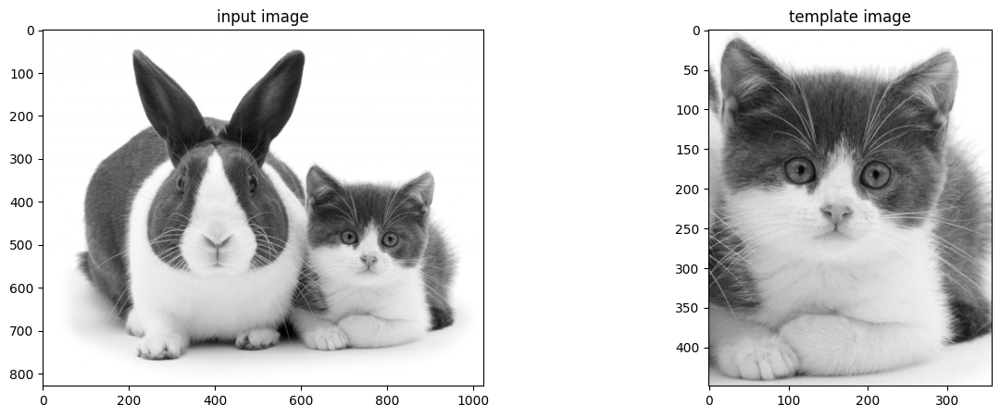

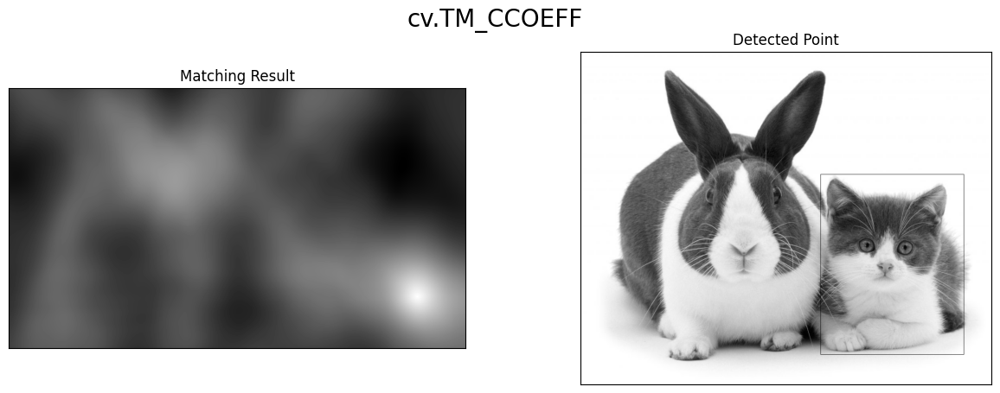

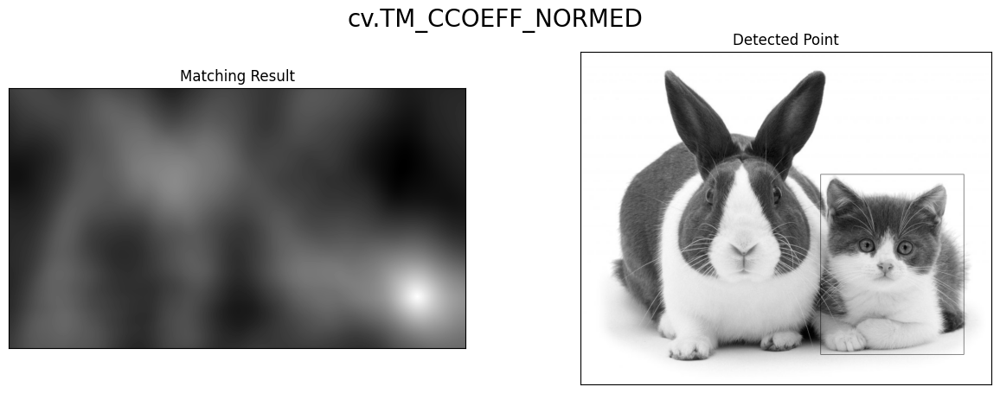

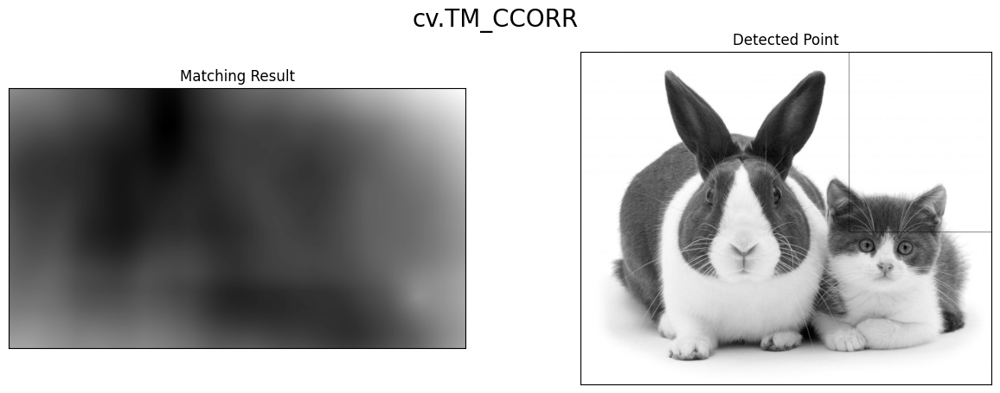

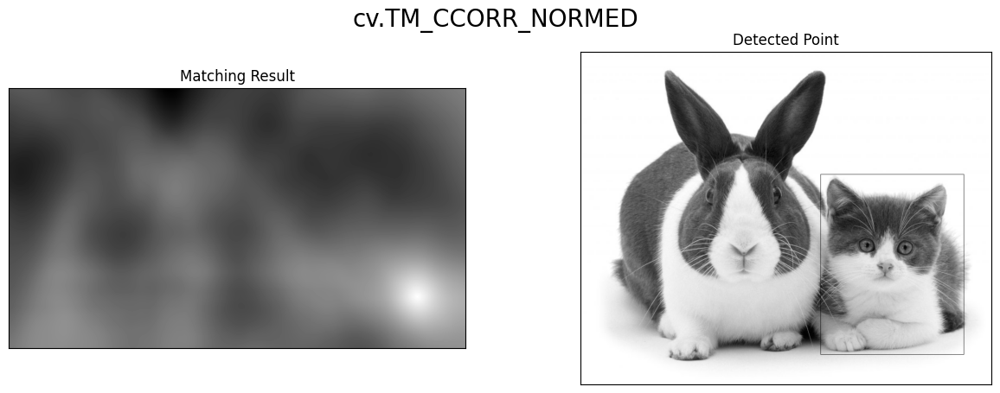

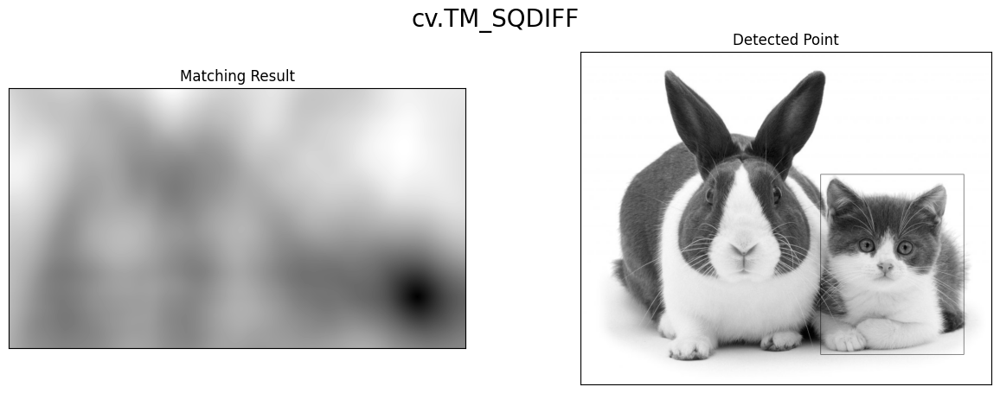

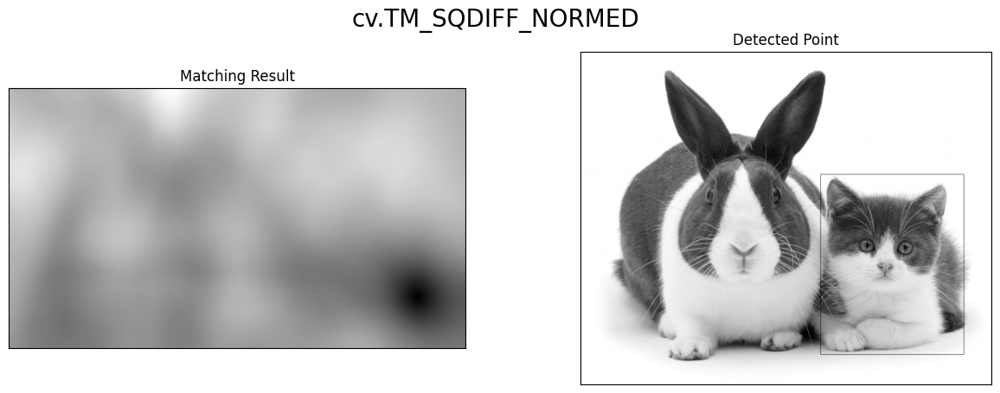

In [9]:
img_in = cv.imread('//content/drive/MyDrive/PCVK SMSTR5/Images-20231002T022922Z-001/Images/Object Detection/cats_and_bunnies.jpg',0)

img2 = img_in.copy()

#load citra template
template = cv.imread('/content/drive/MyDrive/PCVK SMSTR5/Images-20231002T022922Z-001/Images/Object Detection/cat2_templatejpg.jpg',0)
# dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img_in, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

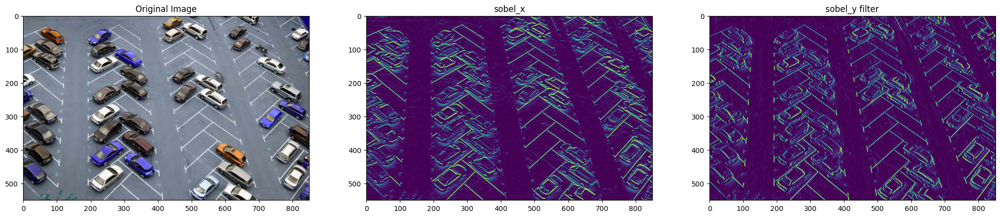

In [10]:
#Sobel Edge Detection
image_original = cv.imread('/content/drive/MyDrive/PCVK SMSTR5/Images-20231002T022922Z-001/Images/Object Detection/parking-lot-cars.jpg', cv.IMREAD_COLOR)

# Convert image to gray scale
image_gray = cv.cvtColor(image_original, cv.COLOR_BGR2GRAY)

# 3x3 Y-direction  kernel
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

# 3 X 3 X-direction kernel
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
filtered_image_y = cv.filter2D(image_gray, -1, sobel_y)
filtered_image_x = cv.filter2D(image_gray, -1, sobel_x)

(fig, (ax1, ax2, ax3)) = plt.subplots(1, 3, figsize=(25, 25))
ax1.title.set_text('Original Image')
ax1.imshow(image_original)
ax2.title.set_text('sobel_x')
ax2.imshow(filtered_image_y)
ax3.title.set_text('sobel_y filter')
ax3.imshow(filtered_image_x)

plt.show()

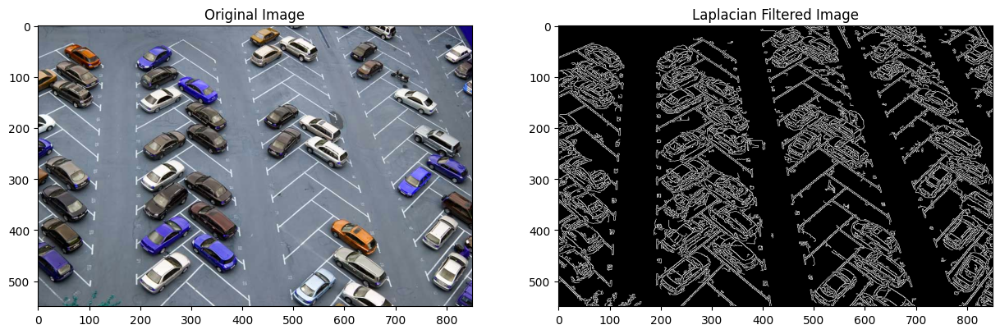

In [11]:
# remove noise
image_gray = cv.cvtColor(image_original, cv.COLOR_BGR2GRAY)
filtered_image = cv.Canny(image_gray, threshold1=20, threshold2=200)

# Plot outputs
(fig, (ax1, ax2)) = plt.subplots(1, 2, figsize=(15, 15))
ax1.title.set_text('Original Image')
ax1.imshow(image_original)
ax2.title.set_text('Laplacian Filtered Image')
ax2.imshow(filtered_image, cmap='gray')

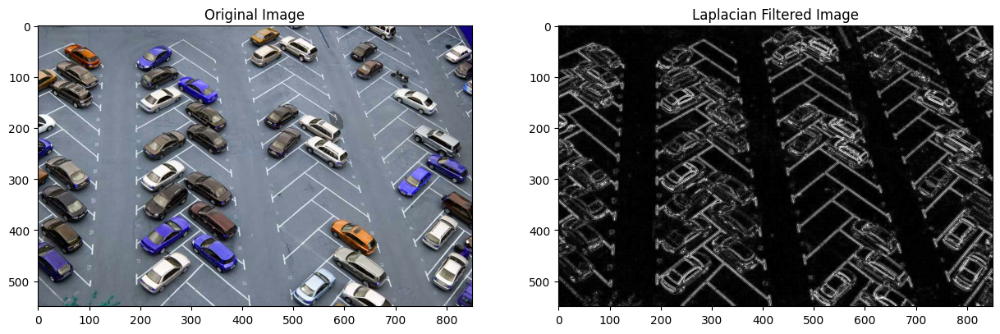

In [12]:
# remove noise
image_gray = cv.cvtColor(image_original, cv.COLOR_BGR2GRAY)

# Reduce noise in image
img = cv.GaussianBlur(image_gray,(3,3),0)

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
filtered_image = cv.Laplacian(img, ksize=3, ddepth=cv.CV_16S)

# converting back to uint8
filtered_image = cv.convertScaleAbs(filtered_image)

# Plot outputs
(fig, (ax1, ax2)) = plt.subplots(1, 2, figsize=(15, 15))
ax1.title.set_text('Original Image')
ax1.imshow(image_original)
ax2.title.set_text('Laplacian Filtered Image')
ax2.imshow(filtered_image, cmap='gray')

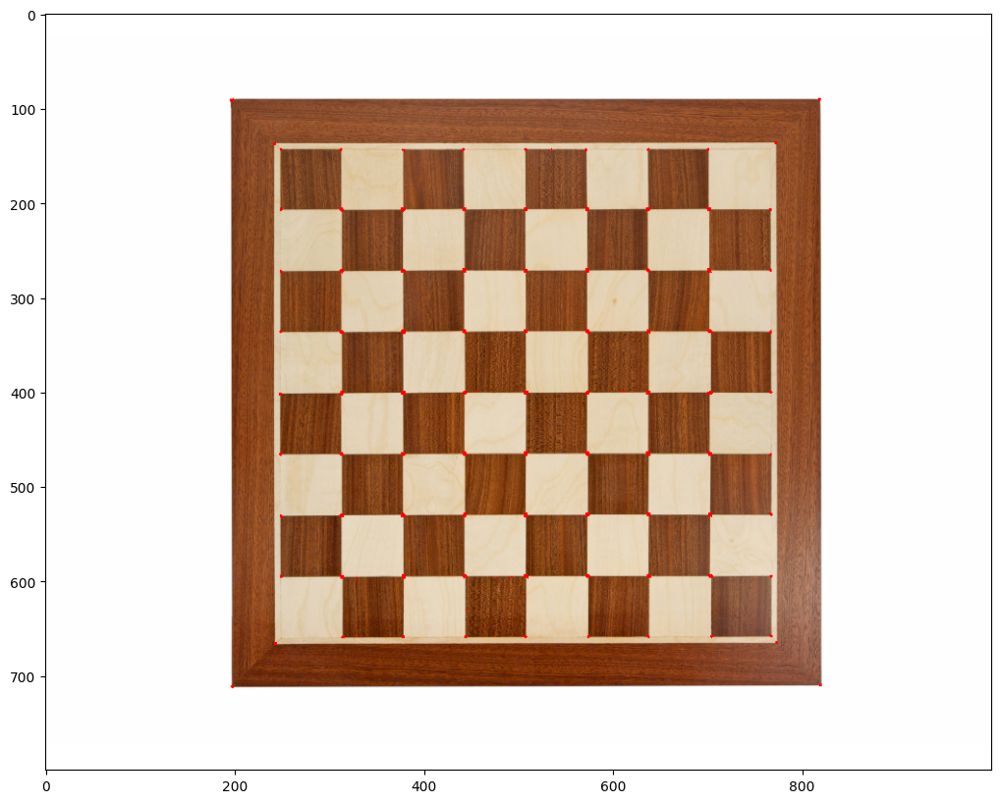

In [14]:
#Harris Corner Detection
#load citra input
input_img = cv.imread('/content/drive/MyDrive/PCVK SMSTR5/Images-20231002T022922Z-001/Images/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)
#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
input_img[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

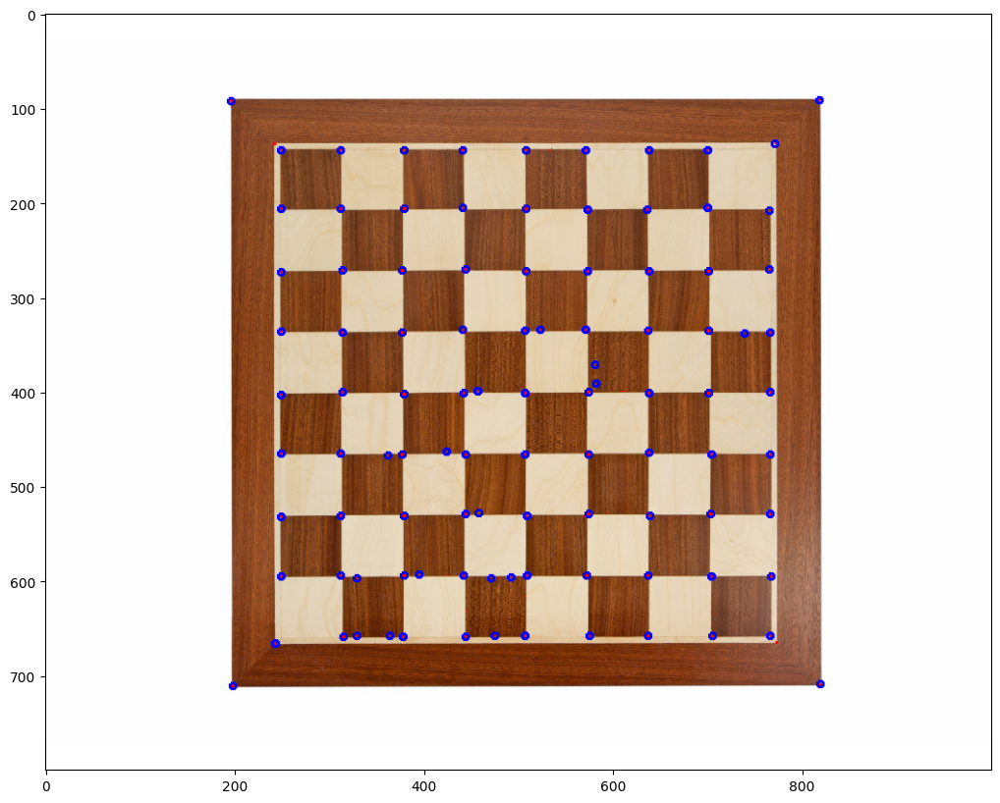

In [15]:
#Shi-Tomasi Detection

corners = cv.goodFeaturesToTrack(gray_img, 100,0.01,10)
corners = np. int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(input_img, (x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))


number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


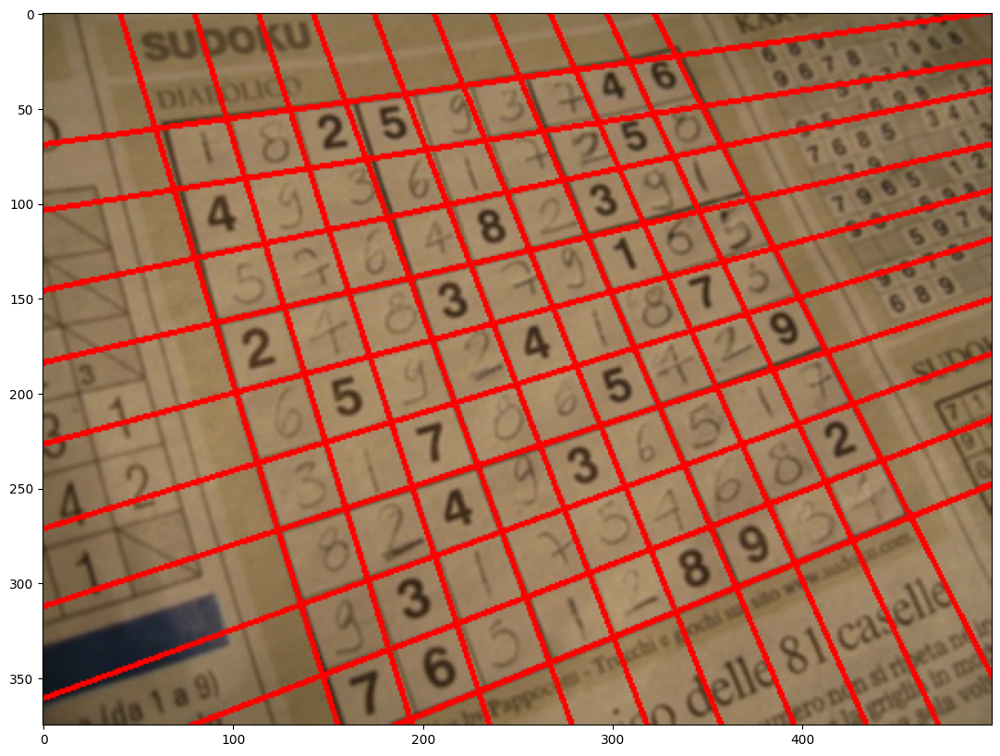

In [16]:
input_img = cv.imread('/content/drive/MyDrive/PCVK SMSTR5/Images-20231002T022922Z-001/Images/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gray, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)


if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)


    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(input_img, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(20,10))
    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

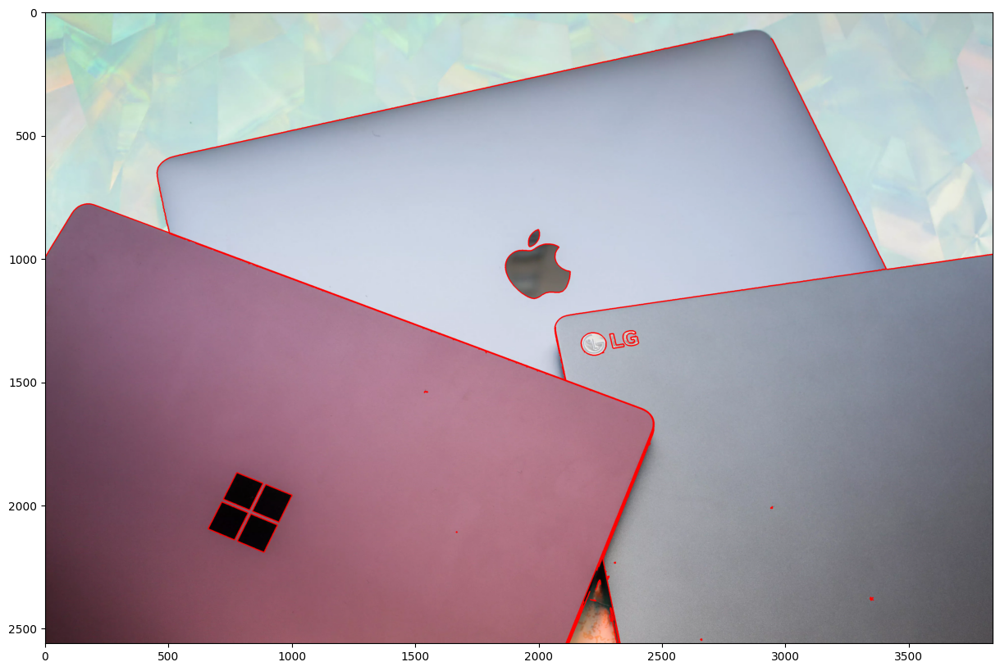

In [17]:
#Countour Detection
img = cv.imread('/content/drive/MyDrive/PCVK SMSTR5/Images-20231002T022922Z-001/Images/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

In [18]:
img_ktp = cv.imread('/content/drive/MyDrive/PCVK SMSTR5/KTP_More/ktp.png')

In [19]:
import cv2
import os

In [20]:
# Definisikan path direktori yang ingin Anda buat
path_sliced = "dataset/sliced"

# Gunakan os.makedirs() untuk membuat direktori, termasuk direktori induk jika belum ada
os.makedirs(path_sliced, exist_ok=True)

# Lokasi hasil pelat
path_plate = "dataset/sliced"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  src = cv2.imread(os.path.join(path_plate, name_file))
  blurred = src.copy()
  gray = blurred.copy()

In [21]:
# Filtering
for i in range(10):
 blurred = cv2.GaussianBlur(img_ktp, (5, 5), 0.5)

Threshold: 156.0


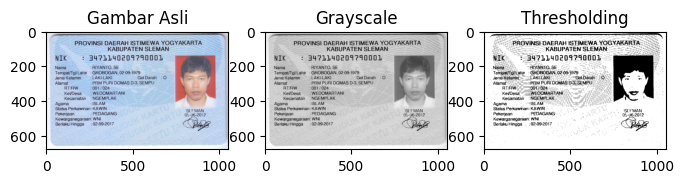

In [22]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Binerisasi citra dengan thresholding (Otsu's thresholding)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("Threshold:", ret)

# Menampilkan gambar asli
plt.figure(figsize=(8, 8))
plt.subplot(131)
plt.imshow(cv2.cvtColor(img_ktp, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(132)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')

# Menampilkan gambar hasil binerisasi
plt.subplot(133)
plt.imshow(bw, cmap='gray')
plt.title('Thresholding')

plt.show()

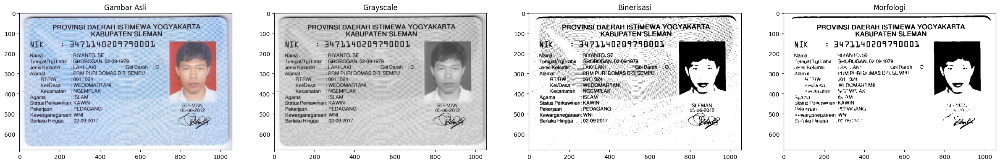

In [23]:
# Terapkan operasi morfologi (dilasi dan erosi)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
dilated = cv2.dilate(bw, kernel, iterations=1)
eroded = cv2.erode(dilated, kernel, iterations=1)

# Menampilkan gambar asli
plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(cv2.cvtColor(img_ktp, cv2.COLOR_BGR2RGB))
plt.title('Gambar Asli')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(142)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')

# Menampilkan gambar hasil binerisasi
plt.subplot(143)
plt.imshow(bw, cmap='gray')
plt.title('Binerisasi')

# Menampilkan gambar hasil dilasi
plt.subplot(144)
plt.imshow(eroded, cmap='gray')
plt.title('Morfologi')

plt.show()

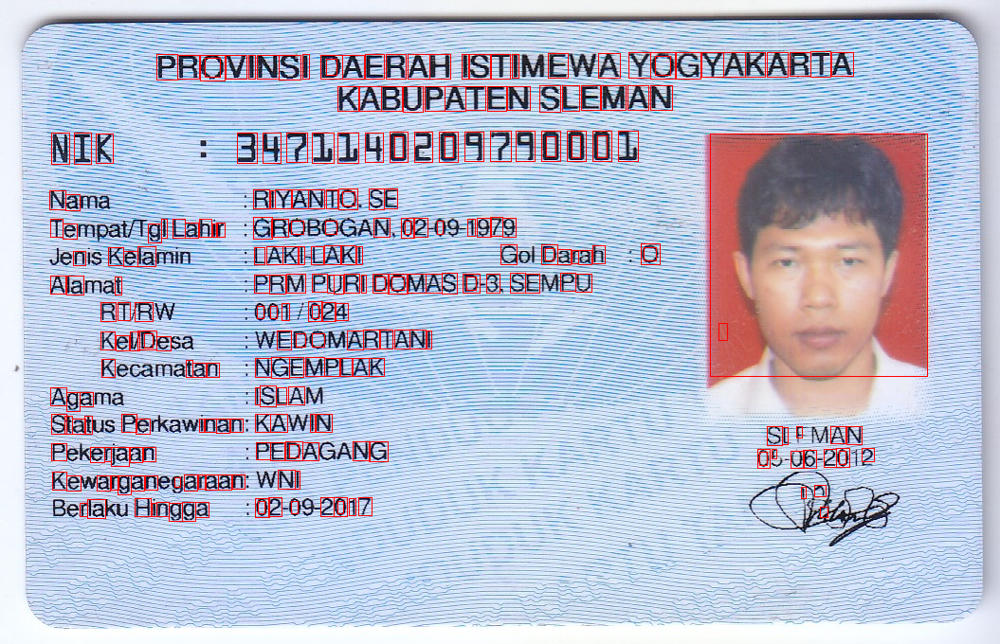

In [24]:
from google.colab.patches import cv2_imshow

# Ubah gambar menjadi skala abu-abu untuk deteksi tepi
gray = cv2.cvtColor(img_ktp, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) adalah ukuran kernel Gaussian, dan 0 adalah deviation

# Thresholding untuk membuat gambar biner
ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

# Temukan kontur pada gambar tepi
contours, hierarchy = cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Gambar kontur pada gambar asli
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv2.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

# Tampilkan gambar dengan kontur
cv2_imshow(img_ktp)

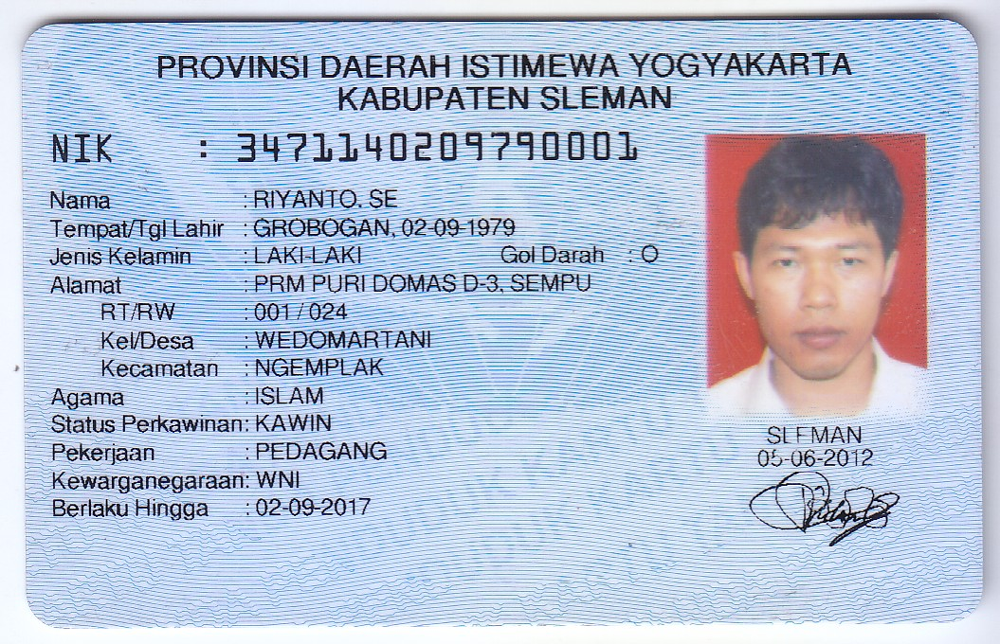

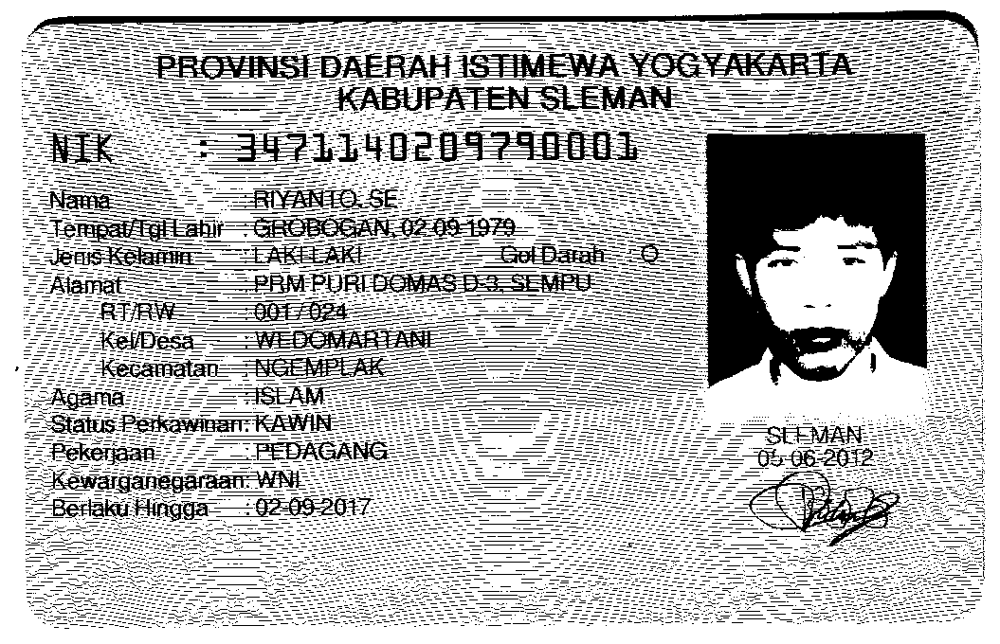

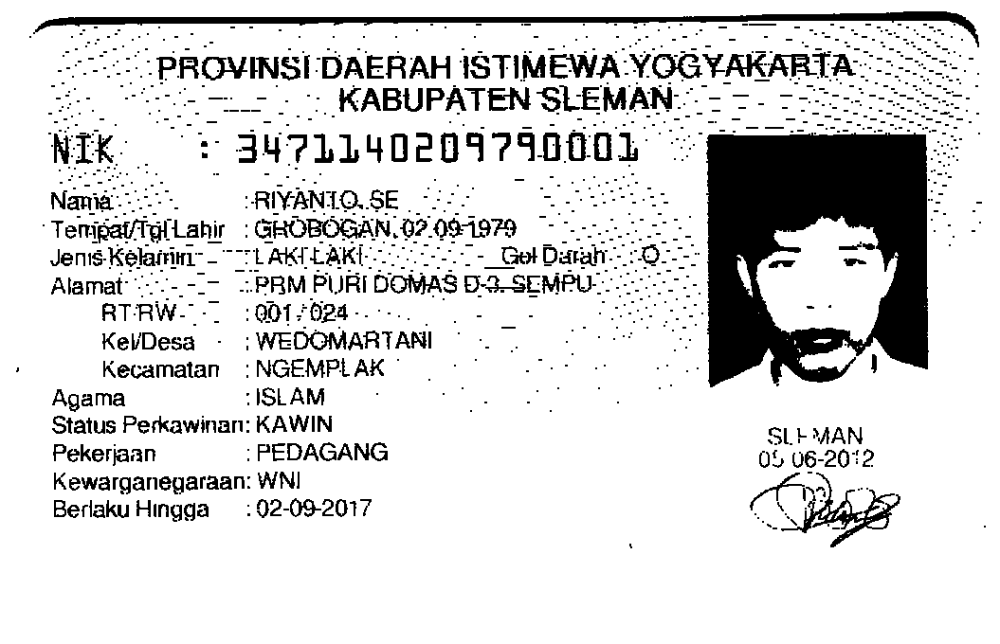

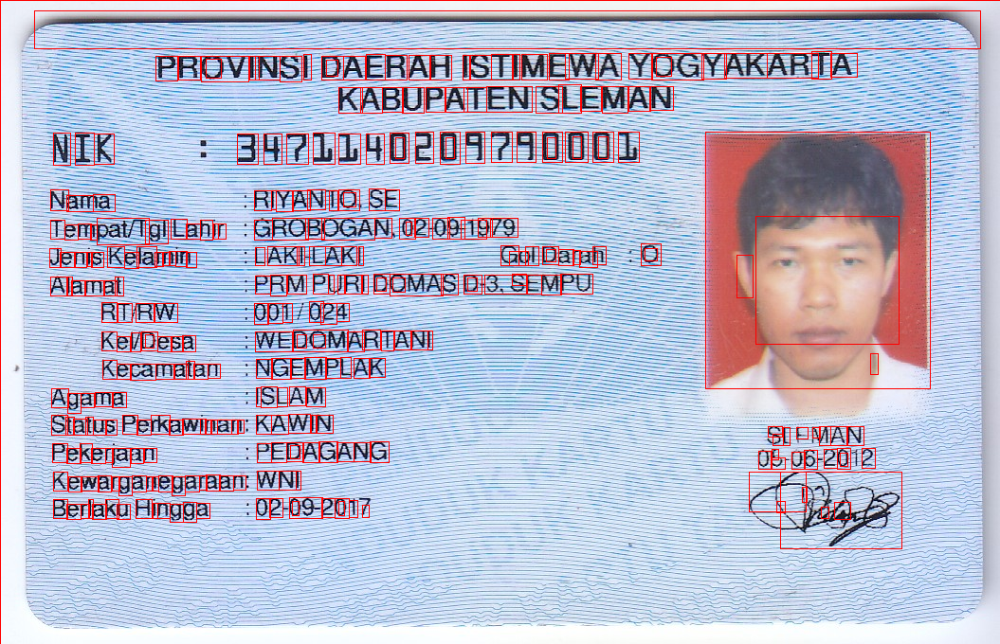

In [26]:
import numpy as np
from skimage import morphology

ktp_test = cv2.imread('/content/drive/MyDrive/PCVK SMSTR5/KTP_More/ktp.png')

blurred = cv2.GaussianBlur(ktp_test, (21,21), 0.5)

sharpened2 = cv2.addWeighted(ktp_test, 1.5, blurred,-0.5,0)
cv2_imshow(sharpened2)

gray2 = cv2.cvtColor(sharpened2, cv2.COLOR_BGR2GRAY)


ret2, bw2 = cv2.threshold(gray2, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
# print(ret, bw.shape)

cv2_imshow(bw2)

kernel = np.ones((2,2),np.uint8)

morphology = cv2.morphologyEx(bw2, cv2.MORPH_CLOSE, kernel)

cv2_imshow(morphology)


contours2, _ = cv2.findContours(morphology, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

for contour in contours2:
  x, y, w, h = cv2.boundingRect(contour)
  if(w>3 and h>10):
    result2 = cv2.rectangle(ktp_test, (x, y), (x+w, y+h),(0,0,255),1)

cv2_imshow(result2)